In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
cd /content/drive/My\ Drive/PROJECT\ YOLO/

[Errno 2] No such file or directory: '/content/drive/My Drive/PROJECT YOLO/'
/content


In [ ]:
ls

drive/  sample_data/


In [ ]:
import os
import re

In [ ]:
"""
!cp -r images yolo_formatted_images/images
!cp -r labels yolo_formatted_images/labels
"""

cp: cannot stat 'images': No such file or directory
cp: cannot stat 'labels': No such file or directory


In [ ]:
"""
labels = os.listdir('yolo_formatted_images/labels/test/')
for l in labels:
  os.rename('yolo_formatted_images/labels/test/'+l, 'yolo_formatted_images/labels/test/'+re.sub('.jpg', '', l))
"""

In [ ]:
"""
from zipfile import ZipFile 
with ZipFile('annotated-HQ.zip', 'r') as zip: 
    print('Extracting all the files now...') 
    zip.extractall() 
"""

"\nfrom zipfile import ZipFile \nwith ZipFile('annotated-HQ.zip', 'r') as zip: \n    print('Extracting all the files now...') \n    zip.extractall() \n"

In [ ]:
!nvidia-smi

Mon Dec 28 07:03:48 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.27.04    Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   55C    P8    10W /  70W |      0MiB / 15079MiB |      0%      Default |
|                               |                      |                 ERR! |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
!sudo apt-get install tree -qq > /dev/null

In [ ]:
#!pip install torch==1.6.0+cu101 torchvision==0.7.0+cu101 -f https://download.pytorch.org/whl/torch_stable.html
#!pip install numpy==1.18.5
!pip install PyYAML==5.3.1
#!pip install git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI

In [ ]:
!git clone https://github.com/NVIDIA/apex && cd apex && pip install -v --no-cache-dir --global-option="--cpp_ext" --global-option="--cuda_ext" . --user && cd .. && rm -rf apex

In [ ]:
from pathlib import Path
from tqdm.notebook import tqdm
import numpy as np
import json
import urllib
import PIL.Image as Image
import cv2
import torch
import torchvision
from IPython.display import display
from sklearn.model_selection import train_test_split
import pandas as po

import seaborn as sns
from pylab import rcParams
import matplotlib.pyplot as plt
from matplotlib import rc

%matplotlib inline
%config InlineBackend.figure_format='retina'
sns.set(style='whitegrid', palette='muted', font_scale=1.2)
rcParams['figure.figsize'] = 16, 10

np.random.seed(42)

# previous work


In [ ]:
with open('annotated-HQ/HQ_new_annotations.json') as f:
    anno = json.load(f)
img_names = list(anno.keys())

In [ ]:
"""
print(img)
print(shape['region_attributes']['class'])
print(shape['shape_attributes']['all_points_x'])
print(shape['shape_attributes']['all_points_y'])
print()
print(shape['shape_attributes']['all_points_x'],shape['shape_attributes']['all_points_y'])
print([(shape['shape_attributes']['all_points_x'][i], shape['shape_attributes']['all_points_y'][i]) for i in range(len(shape['shape_attributes']['all_points_x']))])
"""

"\nprint(img)\nprint(shape['region_attributes']['class'])\nprint(shape['shape_attributes']['all_points_x'])\nprint(shape['shape_attributes']['all_points_y'])\nprint()\nprint(shape['shape_attributes']['all_points_x'],shape['shape_attributes']['all_points_y'])\nprint([(shape['shape_attributes']['all_points_x'][i], shape['shape_attributes']['all_points_y'][i]) for i in range(len(shape['shape_attributes']['all_points_x']))])\n"

In [ ]:
df = po.DataFrame()
for img in tqdm(anno, total=len(anno)):
  #print(anno[img])
  for shape in anno[img]['regions']:
    row = {}
    row['image'] = img
    row['target'] = shape['region_attributes']['class']
    row['points'] = [(shape['shape_attributes']['all_points_x'][i], shape['shape_attributes']['all_points_y'][i]) for i in range(len(shape['shape_attributes']['all_points_x']))]
    #print(row)
    df = df.append(row, ignore_index=True)

In [ ]:
df

,image,points,target
0,img_315_1_0.jpg73811,"[(924, 589), (913, 586), (906, 586), (905, 597...",Nut
1,img_315_1_0.jpg73811,"[(917, 610), (907, 608), (909, 598), (921, 603...",Thread
2,img_315_1_0.jpg73811,"[(893, 592), (897, 584), (886, 578), (877, 576...",Nut
3,img_315_1_0.jpg73811,"[(884, 600), (875, 596), (878, 588), (883, 590...",Thread
4,img_315_1_0.jpg73811,"[(842, 586), (844, 594), (835, 603), (826, 603...",Nut
...,...,...,...
118272,img_324_3_1.jpg54131,"[(492, 30), (510, 29), (511, 55), (490, 54), (...",Thread
118273,img_324_3_1.jpg54131,"[(512, 57), (520, 57), (516, 75), (517, 91), (...",Washer
118274,img_324_3_1.jpg54131,"[(520, 59), (537, 59), (533, 67), (531, 87), (...",Nut
118275,img_324_3_1.jpg54131,"[(536, 62), (544, 64), (539, 81), (544, 93), (...",Nut


In [ ]:
df['target'].value_counts()

Nut       51715
Thread    36334
Head      19427
Washer     5761
Pin        5040
Name: target, dtype: int64

In [ ]:
#df.to_csv('processed_annotations.csv', index=False)

In [ ]:
#df = po.read_csv('processed_annotations.csv')

In [ ]:
categories = list(df['target'].unique())
categories

['Nut', 'Thread', 'Head', 'Pin', 'Washer']

In [ ]:
len(df['image'].unique())

8041

In [ ]:
df = df.sample(frac=1, random_state=42).reset_index(drop=True)
df_train = df[:int(0.6*len(df))]
df_val = df[int(0.6*len(df)):int(0.8*len(df))]
df_test = df[int(0.8*len(df)):]

In [ ]:
len(df_train), len(df_val), len(df_test)

(70966, 23655, 23656)

In [ ]:
img = cv2.cvtColor(cv2.imread(f'annotated-HQ/img_315_1_0.jpg'), cv2.COLOR_BGR2RGB)
img.shape

(1000, 1000, 3)

In [ ]:
plt.imshow(img)
plt.axis('off');

In [ ]:
for i in range(len(df_train)):
  print(df_train.iloc[i]['target'])
  print(df_train.iloc[i]['points'])
  break

Nut
[(718, 231), (714, 235), (714, 258), (718, 260), (728, 260), (765, 260), (766, 235), (758, 232), (718, 231)]


In [ ]:
df.head()

,image,points,target
0,img_2654_2_1.jpg118606,"[(718, 231), (714, 235), (714, 258), (718, 260...",Nut
1,img_537_4_3.jpg202790,"[(417, 571), (409, 561), (404, 550), (405, 541...",Washer
2,img_1005_5_0.jpg26475,"[(99, 84), (117, 85), (126, 84), (132, 73), (1...",Nut
3,img_1697_4_1.jpg112551,"[(787, 477), (788, 489), (813, 493), (829, 492...",Head
4,img_1100_0_0.jpg85647,"[(303, 858), (306, 889), (344, 888), (340, 859...",Thread


In [ ]:
df_c = df.copy()
del df

In [ ]:
def create_dataset(df, mode):
  image_path = 'yolo_formatted_images/' + 'images/' + mode + '/'
  label_path = 'yolo_formatted_images/' + 'labels/' + mode + '/'
  for i in tqdm(range(len(df)), total=len(df)):
    img_name = df.iloc[i]['image'].split('.')[0] + '.jpg'
    img_loc = 'annotated-HQ/'+img_name
    img_label = df.iloc[i]['target']

    # save image
    try:
      img = cv2.cvtColor(cv2.imread(img_loc), cv2.COLOR_BGR2RGB)
    except:
      print(img_loc)
      raise

    img = Image.fromarray(img)
    img.save(image_path+img_name, "JPEG")

    # make box
    points = df.iloc[i]['points']
    x_s = [tup[0]/1000 for tup in df.iloc[i]['points']]
    y_s = [tup[1]/960 for tup in df.iloc[i]['points']]
    w = max(x_s) - min(x_s)
    h = max(y_s) - min(y_s)
    center = (min(x_s) + w/2, min(y_s) + h/2)

    # save label
    category_idx = categories.index(img_label)
    label_name = f"{img_name}.txt"
    with open(label_path+label_name, 'w') as label_file:
      label_file.write(
              f"{category_idx} {center[0]} {center[1]} {w} {h}\n"
            )

In [ ]:
create_dataset(df_train, 'train')

In [ ]:
create_dataset(df_val, 'val')

In [ ]:
create_dataset(df_test, 'test')

In [ ]:
!tree yolo_formatted_images -L 2

yolo_formatted_images
├── images
│   ├── test
│   ├── train
│   └── val
├── images.zip
├── labels
│   ├── test
│   ├── train
│   └── val
└── labels.zip

8 directories, 2 files


# Run this


In [ ]:
cd /content/drive/MyDrive/December/yolov5/yolov5/

/content/drive/MyDrive/December/yolov5/yolov5


In [ ]:
ls 

 data/               LICENSE              requirements.txt   utils/
 detect.py           models/              runs/              weights/
 Dockerfile         'Predicted Images'/   test.py            yolov5s.pt
 hubconf.py          __pycache__/         train.py           yolov5x.pt
 inference_images/   README.md            tutorial.ipynb


In [ ]:
!python train.py --img 1024 --batch 20 --epochs 5 \
  --data ./data/config.yaml --cfg ./models/yolov5s.yaml  --weights yolov5s.pt --name yolov5s_nuts_bolts #--cache

Using torch 1.7.0+cu101 CUDA:0 (Tesla T4, 15079MB)

Namespace(adam=False, batch_size=20, bucket='', cache_images=False, cfg='./models/yolov5s.yaml', data='./data/config.yaml', device='', epochs=5, evolve=False, exist_ok=False, global_rank=-1, hyp='data/hyp.scratch.yaml', image_weights=False, img_size=[1024, 1024], local_rank=-1, log_imgs=16, multi_scale=False, name='yolov5s_nuts_bolts', noautoanchor=False, nosave=False, notest=False, project='runs/train', rect=False, resume=False, save_dir='runs/train/yolov5s_nuts_bolts8', single_cls=False, sync_bn=False, total_batch_size=20, weights='yolov5s.pt', workers=8, world_size=1)
Start Tensorboard with "tensorboard --logdir runs/train", view at http://localhost:6006/
2020-12-28 07:31:53.729635: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcudart.so.10.1
Hyperparameters {'lr0': 0.01, 'lrf': 0.2, 'momentum': 0.937, 'weight_decay': 0.0005, 'warmup_epochs': 3.0, 'warmup_momentum': 0.8, 'war

In [ ]:
ls

 data/               LICENSE              requirements.txt   utils/
 detect.py           models/              runs/              weights/
 Dockerfile         'Predicted Images'/   test.py            yolov5s.pt
 hubconf.py          __pycache__/         train.py           yolov5x.pt
 inference_images/   README.md            tutorial.ipynb


In [ ]:
from utils.plots import plot_results
plot_results();

In [ ]:
!mkdir ./inference_images/

In [ ]:
!find ../yolo_formatted_images/images/test/ -maxdepth 1 -type f | head -50 | xargs cp -t "./inference_images/"

In [ ]:
!python detect.py --weights runs/train/yolov5x_nuts_bolts15/weights/best.pt \
  --img 960 --conf 0.4 --source ./inference_images/

Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.4, device='', exist_ok=False, img_size=960, iou_thres=0.45, name='exp', project='runs/detect', save_conf=False, save_txt=False, source='./inference_images/', update=False, view_img=False, weights=['runs/train/yolov5x_nuts_bolts15/weights/best.pt'])
Using torch 1.6.0+cu101 CUDA:0 (Tesla P100-PCIE-16GB, 16280MB)

Fusing layers... 
Model Summary: 484 layers, 88417530 parameters, 0 gradients
image 1/50 /content/drive/My Drive/PROJECT YOLO/yolov5/inference_images/img_1017_3_0.jpg: 960x960 Done. (0.084s)
image 2/50 /content/drive/My Drive/PROJECT YOLO/yolov5/inference_images/img_1037_5_0.jpg: 960x960 Done. (0.079s)
image 3/50 /content/drive/My Drive/PROJECT YOLO/yolov5/inference_images/img_1038_1_3.jpg: 672x960 Done. (0.062s)
image 4/50 /content/drive/My Drive/PROJECT YOLO/yolov5/inference_images/img_1041_2_0.jpg: 960x960 Done. (0.080s)
image 5/50 /content/drive/My Drive/PROJECT YOLO/yolov5/inference_images/img_1100_0_0.

We'll write a helper function to show the results:

In [ ]:
%cd runs/
!ls

/content/drive/My Drive/PROJECT YOLO/yolov5/runs
detect	train


In [ ]:
cd detect

/content/drive/My Drive/PROJECT YOLO/yolov5/runs/detect


In [ ]:
ls

img_1017_3_0.jpg  img_1638_2_0.jpg  img_2221_2_2.jpg  img_340_3_4.jpg
img_1037_5_0.jpg  img_1652_2_1.jpg  img_2270_3_4.jpg  img_34_5_2.jpg
img_1038_1_3.jpg  img_16_5_2.jpg    img_2342_1_1.jpg  img_395_2_1.jpg
img_1041_2_0.jpg  img_1684_2_2.jpg  img_2394_1_1.jpg  img_408_1_1.jpg
img_1100_0_0.jpg  img_1699_2_3.jpg  img_2488_1_0.jpg  img_543_3_1.jpg
img_1230_3_0.jpg  img_1741_2_2.jpg  img_2506_1_3.jpg  img_598_3_1.jpg
img_125_2_2.jpg   img_1756_4_5.jpg  img_2513_0_1.jpg  img_610_4_1.jpg
img_1261_3_0.jpg  img_1781_1_0.jpg  img_2555_2_0.jpg  img_610_4_2.jpg
img_1309_1_2.jpg  img_1906_0_0.jpg  img_2626_4_1.jpg  img_641_3_2.jpg
img_1318_4_4.jpg  img_1932_7_0.jpg  img_2687_0_2.jpg  img_921_1_1.jpg
img_1318_5_2.jpg  img_1939_1_1.jpg  img_2691_1_0.jpg  img_935_3_0.jpg
img_1336_3_3.jpg  img_2086_1_3.jpg  img_2759_3_0.jpg
img_1629_5_0.jpg  img_2094_3_4.jpg  img_34_0_1.jpg


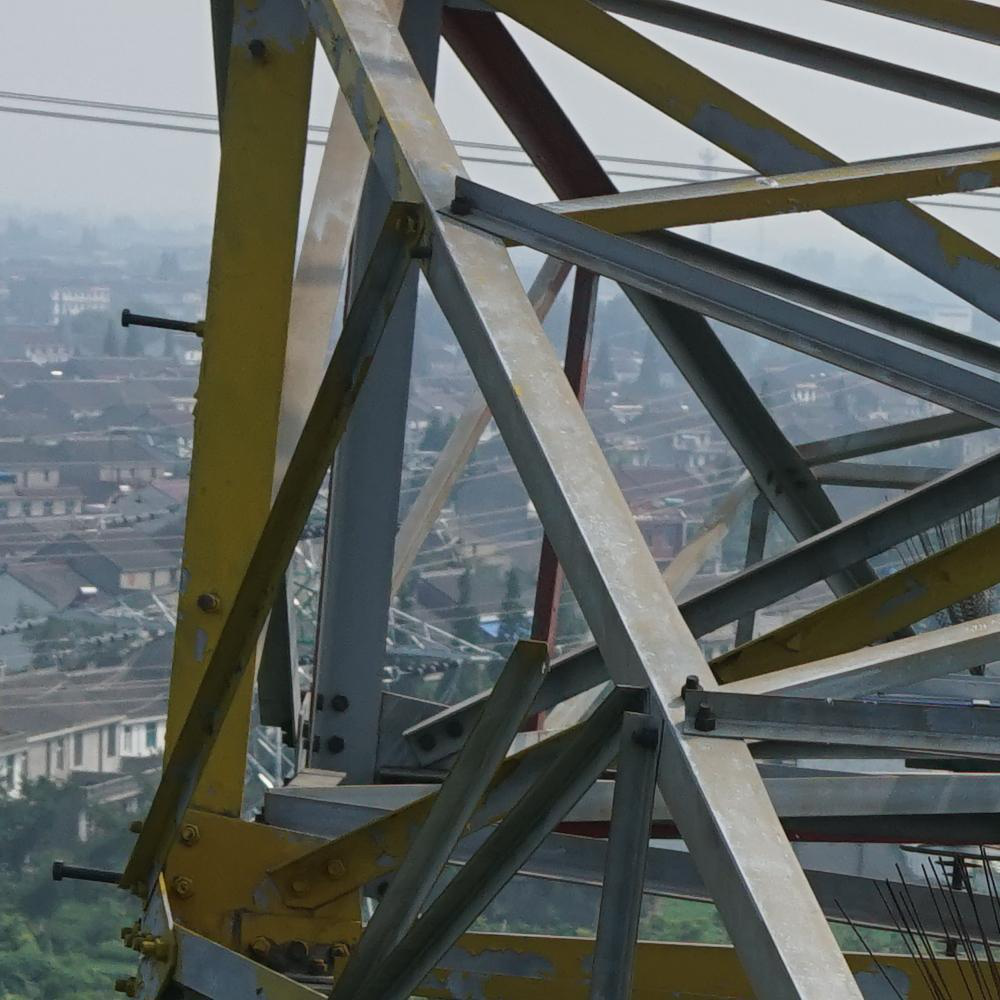

In [ ]:
Image.open('img_2759_3_0.jpg')

In [ ]:
def load_image(img_path: Path, resize=True):
  img = cv2.cvtColor(cv2.imread(str(img_path)), cv2.COLOR_BGR2RGB)
  img = cv2.resize(img, (128, 256), interpolation = cv2.INTER_AREA)
  return img

def show_grid(image_paths):
  images = [load_image(img) for img in image_paths]
  images = torch.as_tensor(images)
  images = images.permute(0, 3, 1, 2)
  grid_img = torchvision.utils.make_grid(images, nrow=11)
  plt.figure(figsize=(24, 12))
  plt.imshow(grid_img.permute(1, 2, 0))
  plt.axis('off');

In [ ]:
w=5
h=4
fig=plt.figure(figsize=(8, 8))
columns = 5
rows = 2
for i in range(1, columns*rows +1):
    img = np.random.randint(10, size=(h,w))
    fig.add_subplot(rows, columns, i)
    plt.imshow(img)
plt.show()

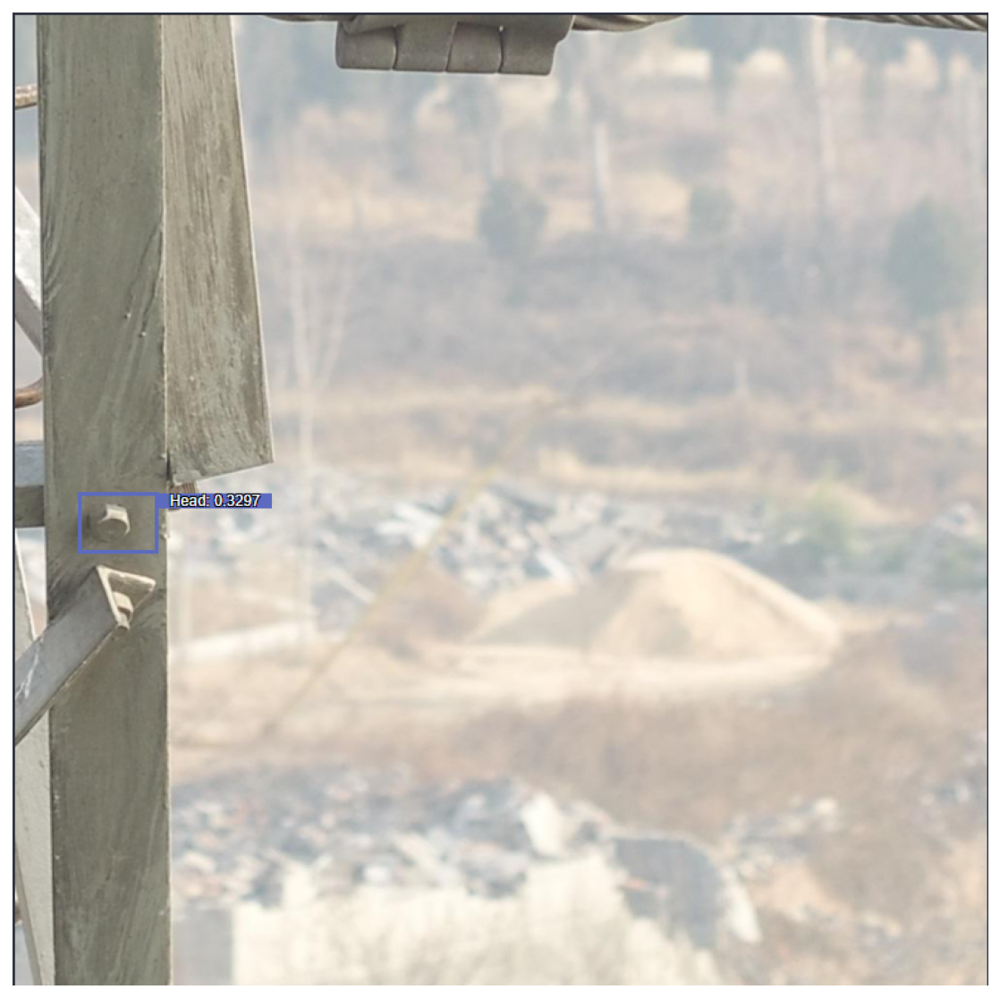

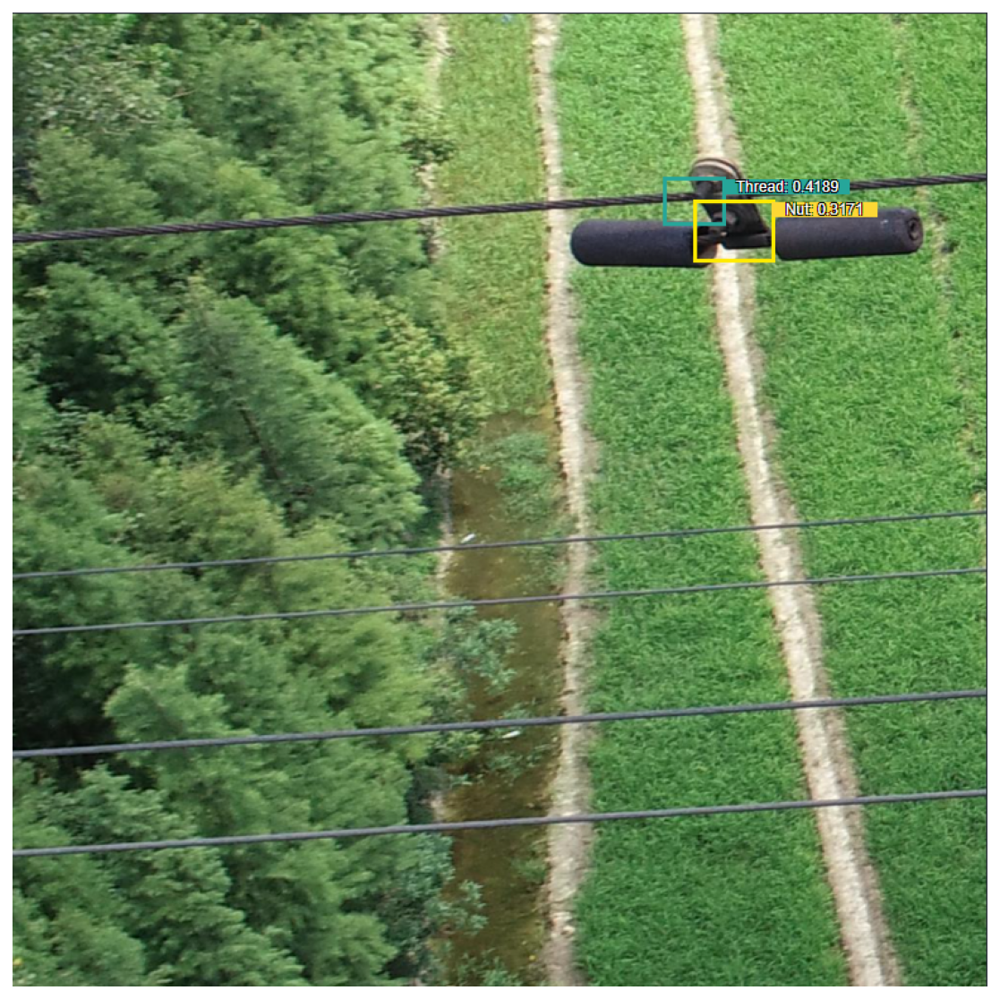

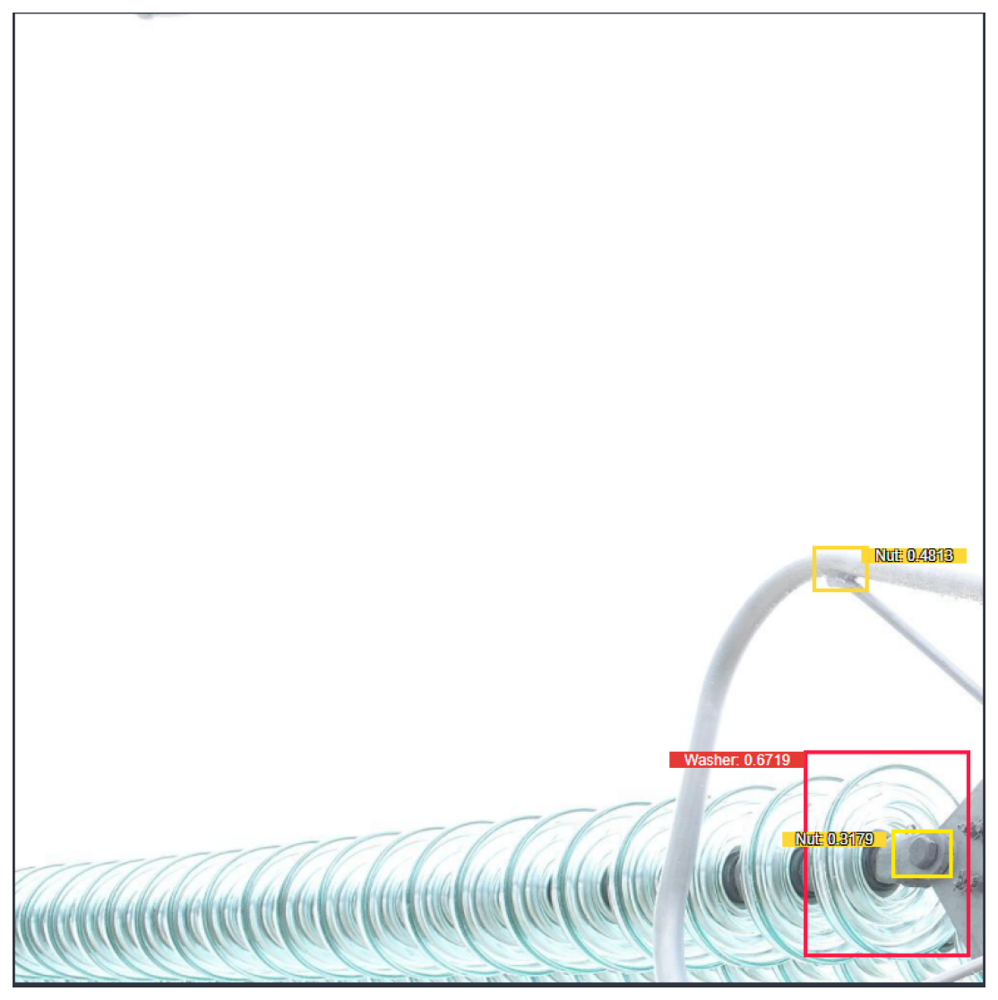

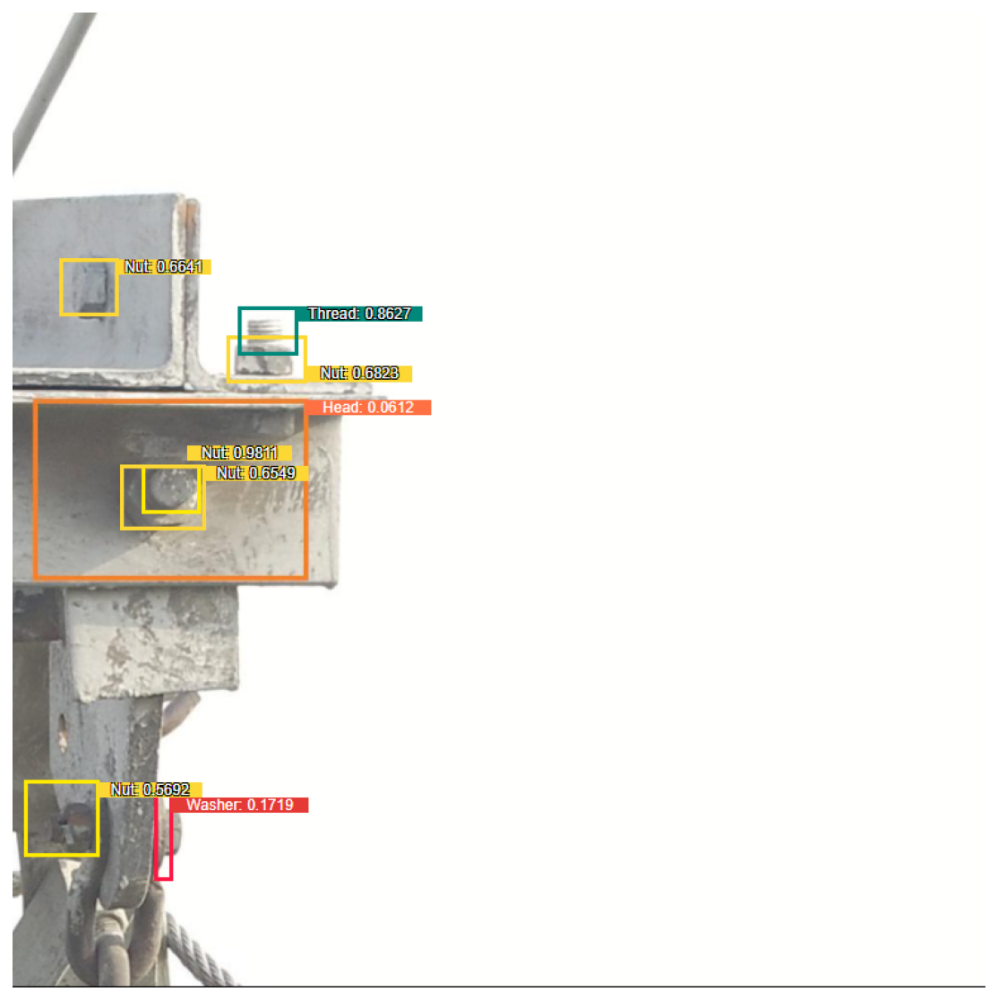

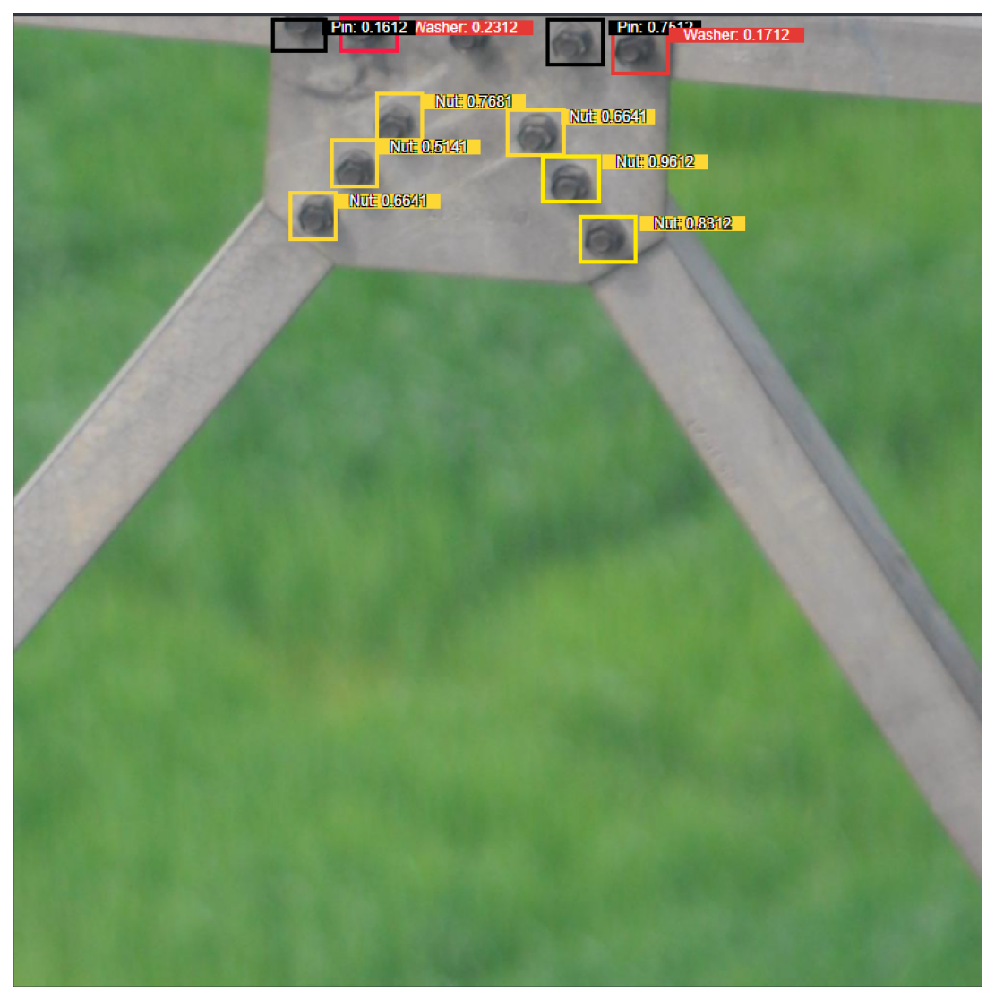

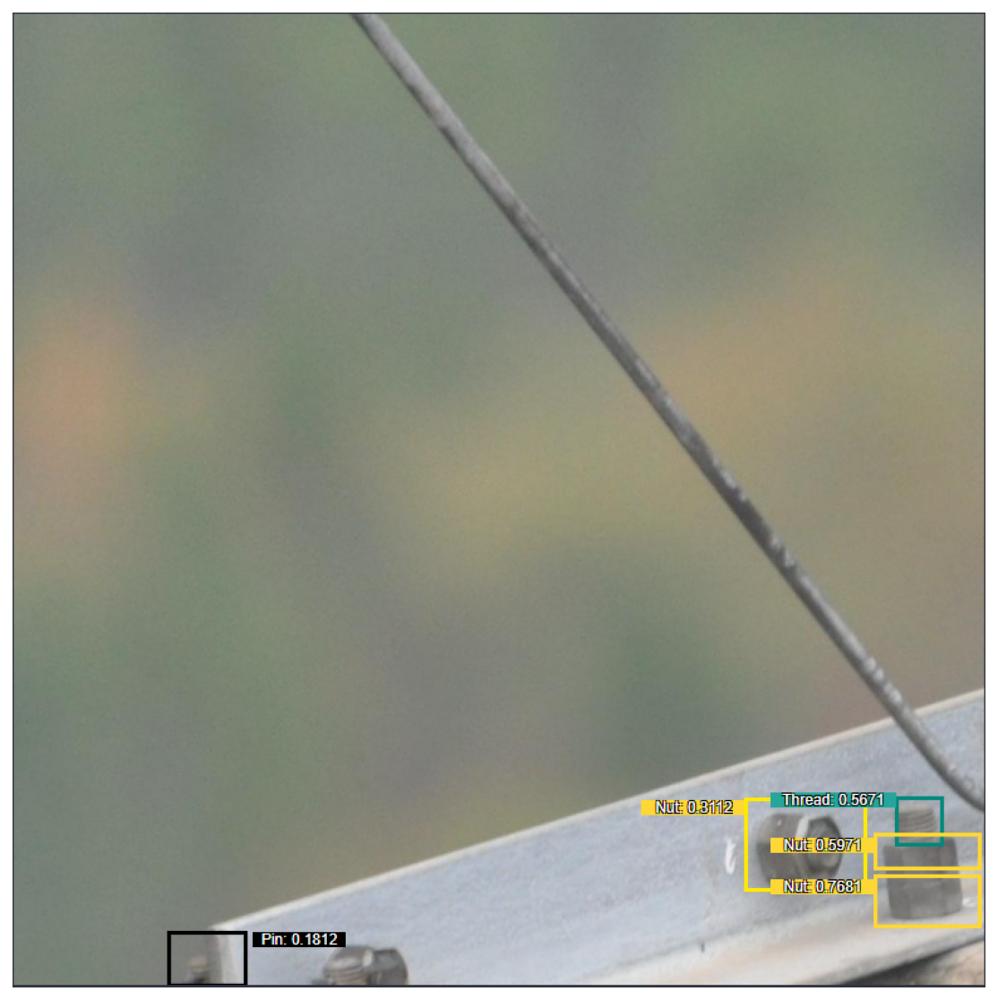

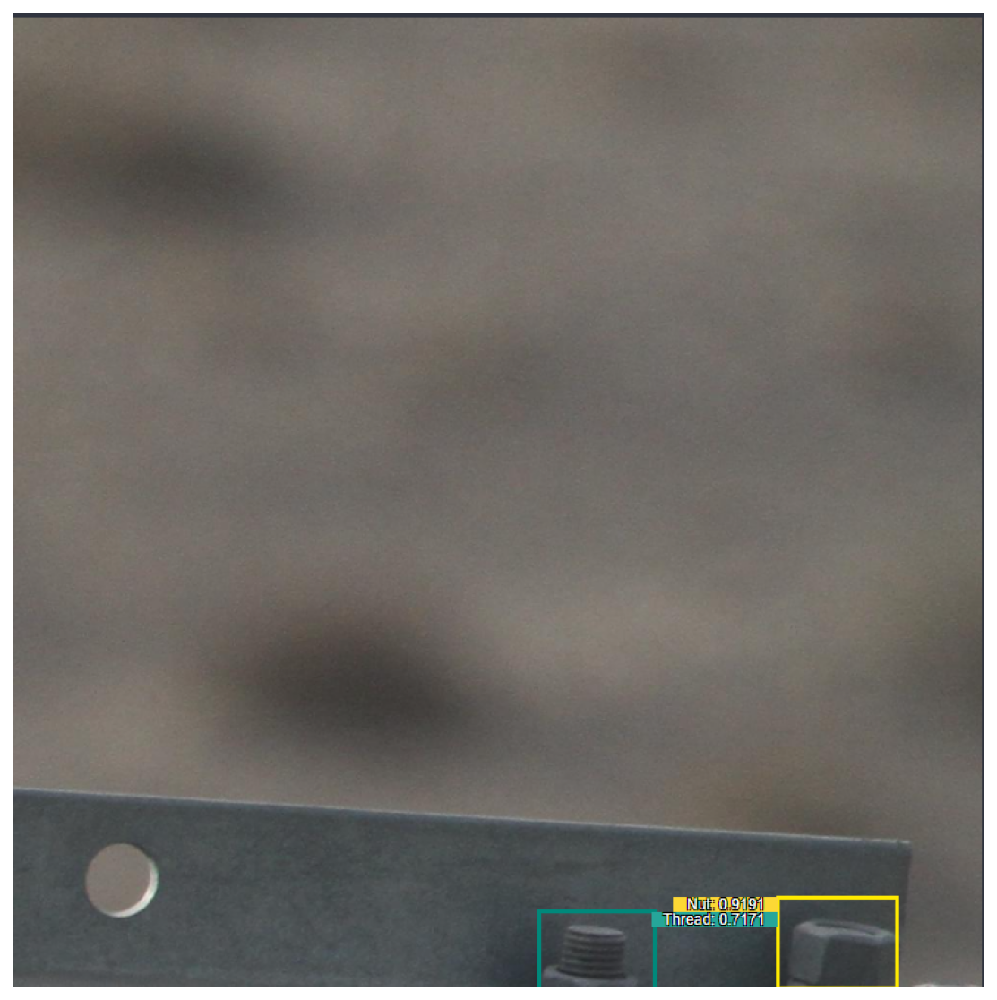

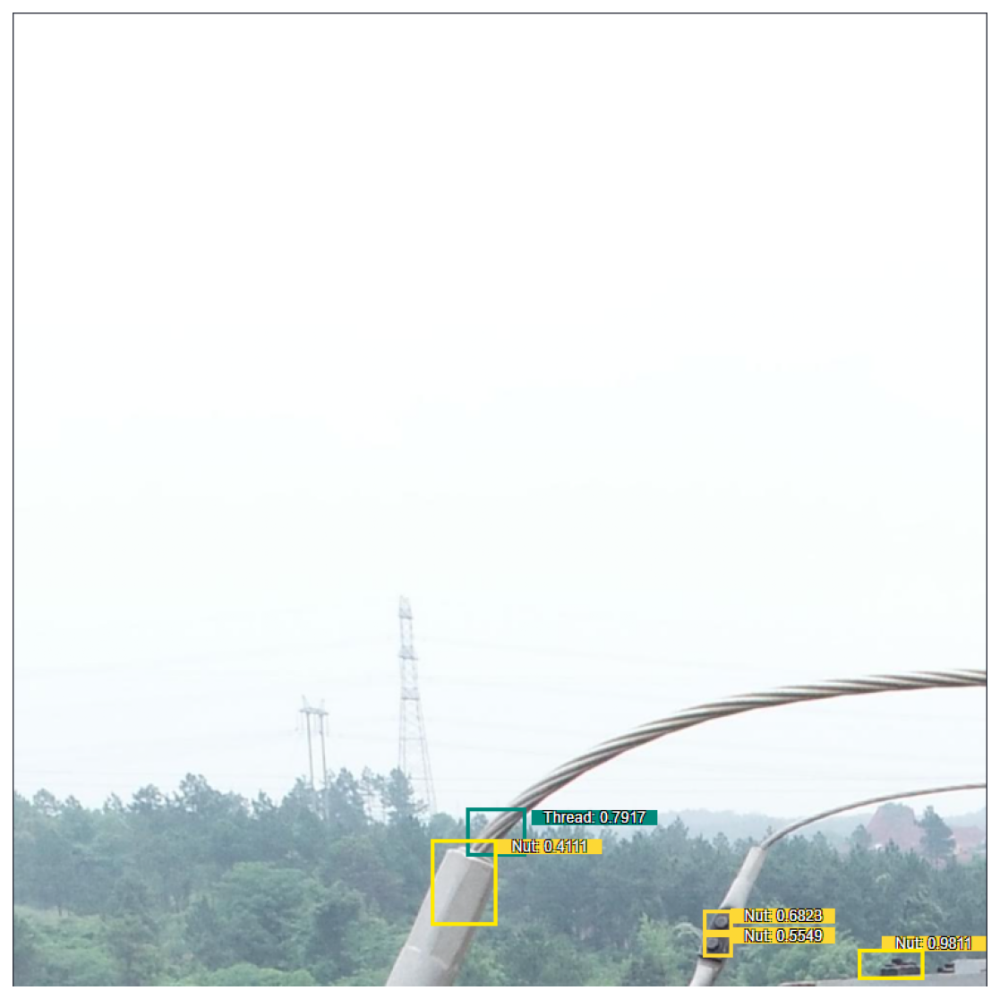

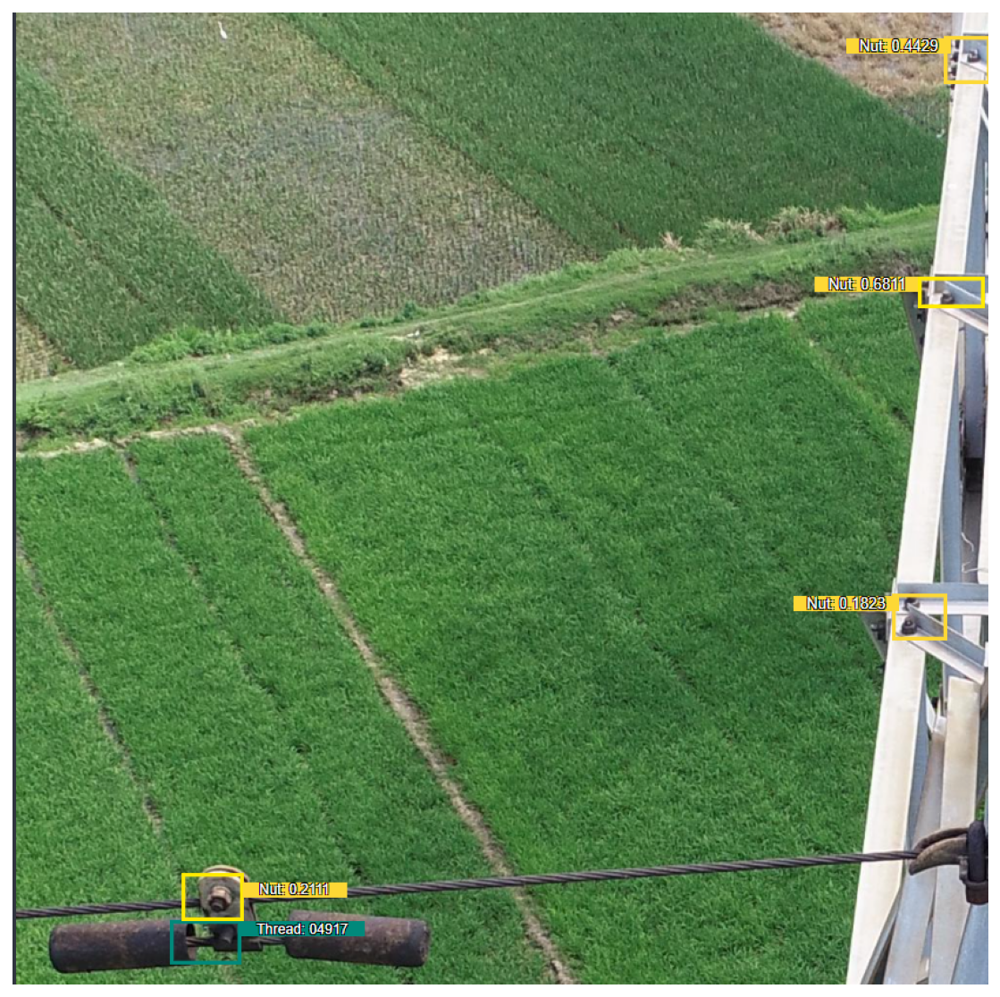

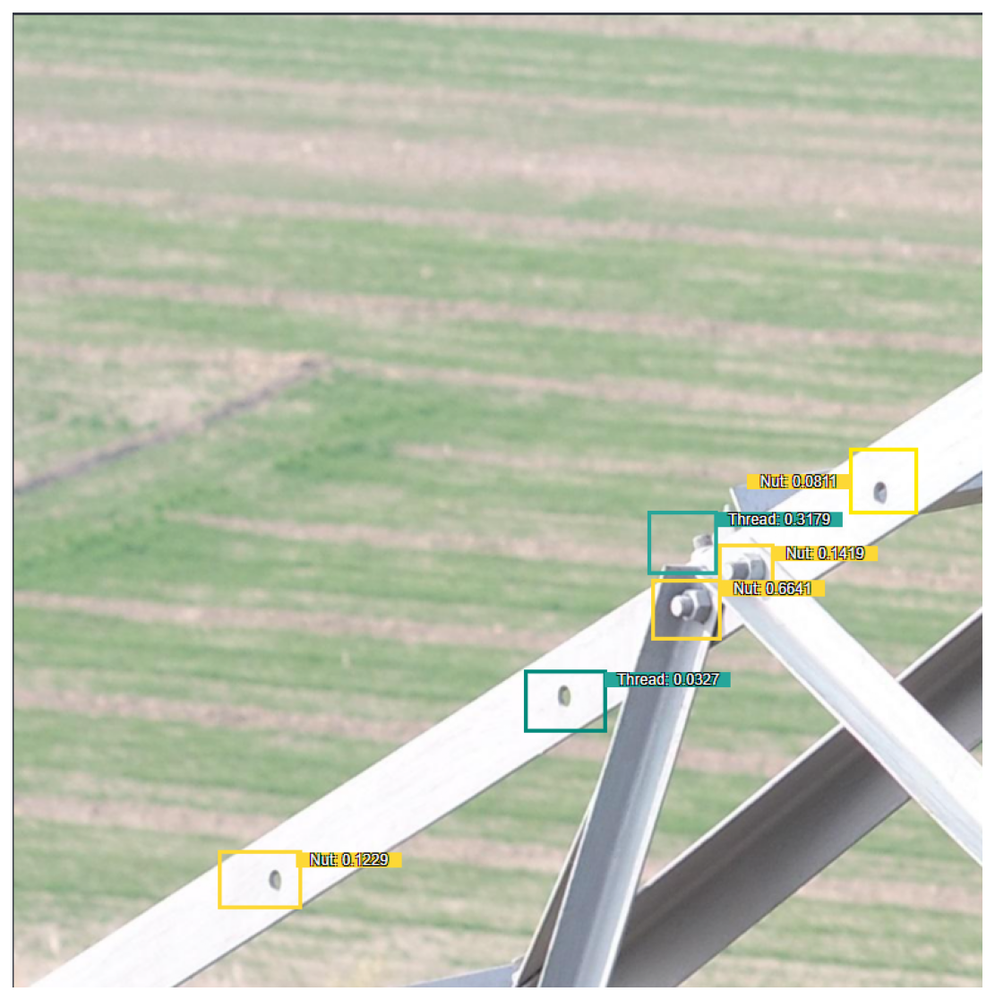

In [ ]:
img_paths = list(Path("yolov5/Predicted_images").glob("*.jpeg"))[:10]
show_grid(img_paths)

To be honest with you. I am really blown away with the results!